In [1]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

# Generating a black-and-white sketch

In [2]:
def generate_sketch(input_image_path, output_image_path):
    # Read the input image
    image = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)

    # Apply GaussianBlur to reduce noise and help edge detection
    blurred = cv2.GaussianBlur(image, (5, 5), 0)

    # Apply the Canny edge detector
    edges = cv2.Canny(blurred, 30, 100)

    # Invert the image to get white lines on a black background
    inverted_edges = cv2.bitwise_not(edges)

    # Save the result
    cv2.imwrite(output_image_path, inverted_edges)

    return inverted_edges

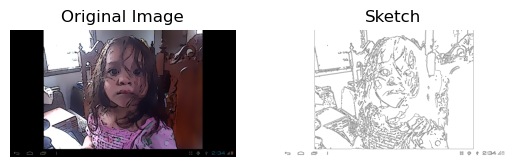

In [45]:
    input_image_path = "screenshot.png"
    output_image_path = "sketch_output.jpg"

    # Generate sketch and get the original image
    sketch = generate_sketch(input_image_path, output_image_path)
    original = cv2.imread(input_image_path)

    # Display the images side by side
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(sketch, cmap='gray')
    plt.title('Sketch')
    plt.axis('off')

    plt.show()

# Generating a black-and-white sketch with camera

In [3]:
def generate_sketch(input_image, output_image_path):
    # Convert the input image to grayscale
    image = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply GaussianBlur to reduce noise and help edge detection
    blurred = cv2.GaussianBlur(image, (5, 5), 0)

    # Apply the Canny edge detector
    edges = cv2.Canny(blurred, 30, 100)

    # Invert the image to get white lines on a black background
    inverted_edges = cv2.bitwise_not(edges)

    # Save the result
    cv2.imwrite(output_image_path, inverted_edges)

    return inverted_edges

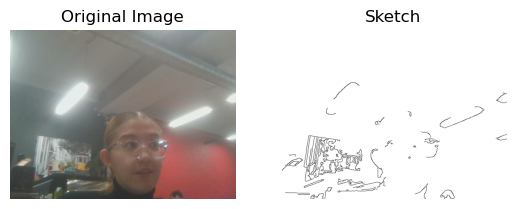

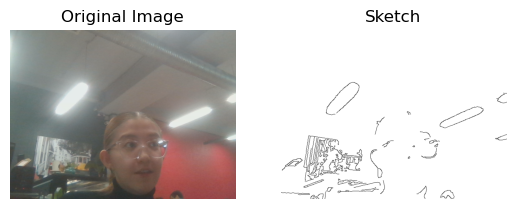

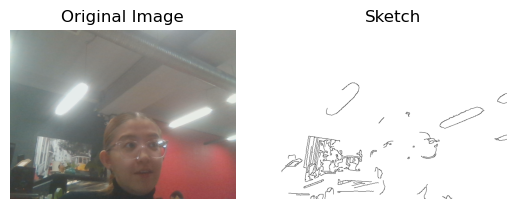

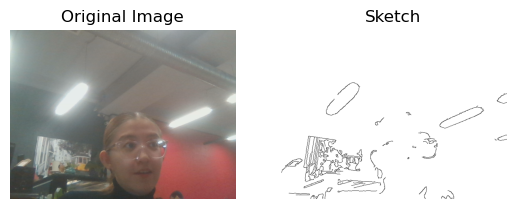

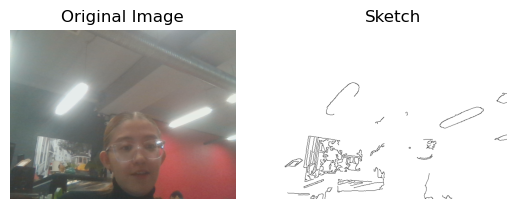

...

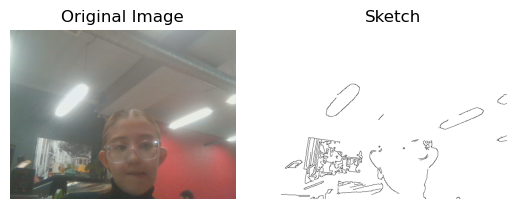

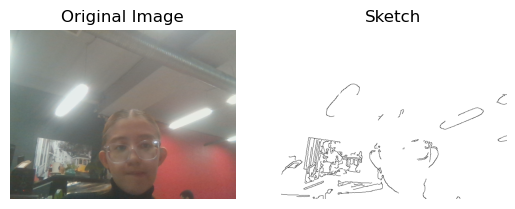

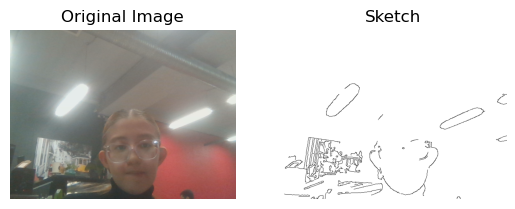

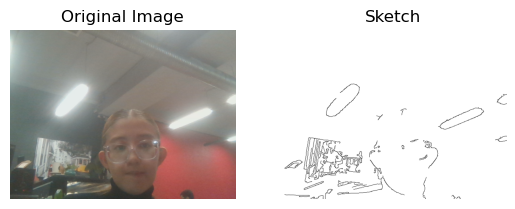

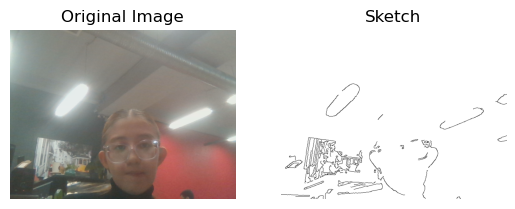

KeyboardInterrupt: 

In [4]:
# Open a connection to the camera (use 0 for the default camera)
cap = cv2.VideoCapture(0)

while True:
    # Capture a frame from the camera
    ret, frame = cap.read()

    # Generate sketch and get the original image
    sketch = generate_sketch(frame, "sketch_output.jpg")

    # Display the images side by side
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(sketch, cmap='gray')
    plt.title('Sketch')
    plt.axis('off')

    plt.show()

# Release the camera and close all windows
cap.release()
cv2.destroyAllWindows()

# Generating a color painting and a cartoon

In [5]:
def generate_cartoon(input_path, output_path):
    # Read the input image
    img = cv2.imread(input_path)

    # Convert the image to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply bilateral filter to smooth the image while preserving edges
    smooth_img = cv2.bilateralFilter(img, d=9, sigmaColor=75, sigmaSpace=75)

    # Create an edge mask using adaptive thresholding
    edges = cv2.adaptiveThreshold(gray_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 12)

    # Combine the smoothed image with the edge mask
    cartoon_result = cv2.bitwise_and(smooth_img, smooth_img, mask=edges)

    # Save the cartoon result
    cv2.imwrite(output_path, cartoon_result)

    return cartoon_result

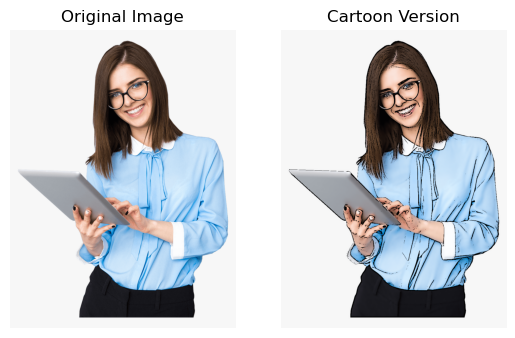

In [6]:
    input_image_path = "Girl.png"
    output_cartoon_path = "cartoon_output.jpg"

    # Generate cartoon version and get the original image
    cartoon_result = generate_cartoon(input_image_path, output_cartoon_path)
    original = cv2.imread(input_image_path)

    # Display the images side by side 
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(cartoon_result, cv2.COLOR_BGR2RGB))
    plt.title('Cartoon Version')
    plt.axis('off')

    plt.show()

# Generating a color painting and a cartoon with camera 

In [ ]:
def generate_cartoon(input_image):
    # Convert the image to grayscale
    gray_img = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply bilateral filter to smooth the image while preserving edges
    smooth_img = cv2.bilateralFilter(input_image, d=9, sigmaColor=75, sigmaSpace=75)

    # Create an edge mask using adaptive thresholding
    edges = cv2.adaptiveThreshold(gray_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 12)

    # Combine the smoothed image with the edge mask
    cartoon_result = cv2.bitwise_and(smooth_img, smooth_img, mask=edges)

    return cartoon_result

In [ ]:
cap = cv2.VideoCapture(0)

while True:
    # Capture a frame from the camera
    ret, frame = cap.read()

    # Generate cartoon version
    cartoon_result = generate_cartoon(frame)

    # Display the images side by side
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(cartoon_result, cv2.COLOR_BGR2RGB))
    plt.title('Cartoon Version')
    plt.axis('off')

    plt.show()


# Release the camera and close all windows
cap.release()
cv2.destroyAllWindows()

# Generating an "evil" mode using edge filters

In [27]:
def generate_evil_mode(image_path, output_path):
    # Load the original image
    original_image = cv2.imread(image_path)

    # Convert the image to grayscale
    grayscale_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

    # Apply a 7 x 7 Median filter for noise reduction
    median_blur = cv2.medianBlur(grayscale_image, 7)

    # Apply a 3 x 3 Scharr gradient filter along x and y
    scharr_x = cv2.Scharr(median_blur, cv2.CV_64F, 1, 0)
    scharr_y = cv2.Scharr(median_blur, cv2.CV_64F, 0, 1)

    # Combine x and y gradients
    scharr_gradient = cv2.magnitude(scharr_x, scharr_y)

    # Apply a binary threshold with a very low cutoff
    _, evil_mask = cv2.threshold(scharr_gradient, 10, 255, cv2.THRESH_BINARY)

    # Apply a 3 x 3 Median blur to the evil mask
    evil_mask = cv2.medianBlur(evil_mask.astype(np.uint8), 3)

    # Apply the evil mask to the original image
    evil_result = cv2.bitwise_and(original_image, original_image, mask=evil_mask)

    # Save the evil result to the output path
    cv2.imwrite(output_path, evil_result)

    return evil_mask

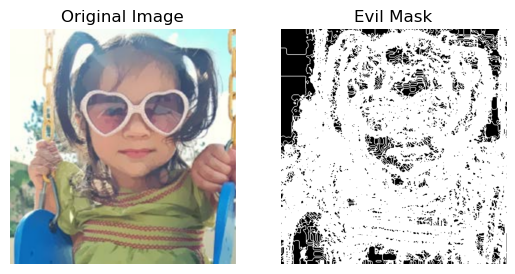

In [28]:
input_image_path = "Girl.png"
output_image_path = "evil_output.jpg"

# Generate evil mode and get the original image
evil_mask = generate_evil_mode(input_image_path, output_image_path)
original = cv2.imread(input_image_path)

# Display the images side by side
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(evil_mask, cmap='gray')
plt.title('Evil Mask')
plt.axis('off')

plt.show()

#  Generating an "evil" mode using edge filters with camera

In [42]:
def generate_evil_mode(input_image):
    # Convert the image to grayscale
    grayscale_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply a 7 x 7 Median filter for noise reduction
    median_blur = cv2.medianBlur(grayscale_image, 7)

    # Apply a 3 x 3 Scharr gradient filter along x and y
    scharr_x = cv2.Scharr(median_blur, cv2.CV_64F, 1, 0)
    scharr_y = cv2.Scharr(median_blur, cv2.CV_64F, 0, 1)

    # Combine x and y gradients
    scharr_gradient = cv2.magnitude(scharr_x, scharr_y)

    # Apply a binary threshold with a very low cutoff
    _, evil_mask = cv2.threshold(scharr_gradient, 10, 255, cv2.THRESH_BINARY)

    # Apply a 3 x 3 Median blur to the evil mask
    evil_mask = cv2.medianBlur(evil_mask.astype(np.uint8), 3)

    # Apply the evil mask to the original image
    evil_result = cv2.bitwise_and(input_image, input_image, mask=evil_mask)

    return evil_mask, evil_result

In [ ]:
# Open a connection to the camera (use 0 for the default camera)
cap = cv2.VideoCapture(0)

while True:
    # Capture a frame from the camera
    ret, frame = cap.read()

    # Generate evil mode
    evil_mask, evil_result = generate_evil_mode(frame)

    # Display the images side by side
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(evil_mask, cmap='gray')
    plt.title('Evil Mask')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(evil_result, cv2.COLOR_BGR2RGB))
    plt.title('Evil Result')
    plt.axis('off')

    plt.show()

# Release the camera and close all windows
cap.release()
cv2.destroyAllWindows()